In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
flatui = ["#5684A0", "#3498db","#9b59b6","#2ecc71" ,"#C93551", "#7EC581", "#D69CC2", "#BEC45F","#FCC38E", "#ED8A4C", "#997474","#8B878D"]
sns.set_palette(flatui) 
sns.set(font_scale = 1.5)
import sys, os



import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA, ARIMAResults
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.stats.diagnostic import acorr_ljungbox



from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error


# This one is only available in the development verison of statsmodels
# Run:
#    pip install git+https://github.com/statsmodels/statsmodels.git
# to install the development version.
from statsmodels.tsa.statespace.sarimax import SARIMAX


# grid search sarima hyperparameters
from math import sqrt
from multiprocessing import cpu_count
from joblib import Parallel
from joblib import delayed
from warnings import catch_warnings
from warnings import filterwarnings
from statsmodels.tsa.statespace.sarimax import SARIMAX


from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, precision_score

from sklearn.linear_model import LinearRegression


from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.ensemble import AdaBoostRegressor

from sklearn.tree import DecisionTreeRegressor


from scipy import signal
from scipy import stats

sys.path.append("..")
from eda_utilities import print_eda_stats
from data_pipeline import dockless_data_pipeline
from data_pipeline import weather_data_pipeline
from data_pipeline import find_top_group_by_column_list
from data_pipeline import prepare_cell_data
from data_pipeline import remove_invalid_trips

In [2]:
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    score = model.score(test_features, test_labels)
    print('Model Performance')
    print("Mean Square Error:", mean_squared_error(test_labels, predictions))
    print("Mean Absoulute Error:", mean_absolute_error(test_labels, predictions))
    print("Score:", score)
    return score

In [3]:
dockless_data = pd.read_csv("https://s3.amazonaws.com/sameera-bucket-1/dockless_mobility/raw_data/Austin_Dockless_Vehicle_Trips.csv")
dockless_vehicles_columns = dockless_data.columns
print_eda_stats(dockless_data, dockless_vehicles_columns, "Austin Dockless Mobility Data")
# Call the dockless_data_pipeline()
dockless_data = dockless_data_pipeline(dockless_data)
dockless_vehicles_columns = dockless_data.columns
print_eda_stats(dockless_data, dockless_vehicles_columns, "Austin Dockless Mobility Data")
dockless_data = remove_invalid_trips(dockless_data)

/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


+--------------------------+---------+-------------+---------------+--------------+-------------------+
|       Column Name        |  dtype  | Total_Count | Unique_Values | df_totalrows | Null Value counts |
+--------------------------+---------+-------------+---------------+--------------+-------------------+
|            ID            |  object |   2746505   |    2746505    |   2746505    |         0         |
|        Device ID         |  object |   2746505   |     26999     |   2746505    |         0         |
|       Vehicle Type       |  object |   2746504   |       3       |   2746505    |         1         |
|      Trip Duration       | float64 |   2746504   |     10521     |   2746505    |         1         |
|      Trip Distance       | float64 |   2746504   |     16125     |   2746505    |         1         |
|        Start Time        |  object |   2746504   |     25694     |   2746505    |         1         |
|         End Time         |  object |   2746504   |     25768  

In [4]:
#Read the weather data from S3 bucket
weather_data = pd.read_csv("https://s3.amazonaws.com/sameera-bucket-1/dockless_mobility/raw_data/Austin_Bergstom_Airport_Weather.csv")
weather_columns = weather_data.columns
print_eda_stats(weather_data, weather_columns, "Austin Weather Data")
weather_data = weather_data_pipeline(weather_data)
weather_columns = weather_data.columns
print_eda_stats(weather_data, weather_columns, "Austin Weather Data")


+-----------------+---------+-------------+---------------+--------------+-------------------+
|   Column Name   |  dtype  | Total_Count | Unique_Values | df_totalrows | Null Value counts |
+-----------------+---------+-------------+---------------+--------------+-------------------+
|     STATION     |  object |     436     |       1       |     436      |         0         |
|       NAME      |  object |     436     |       1       |     436      |         0         |
|     LATITUDE    | float64 |     436     |       1       |     436      |         0         |
|    LONGITUDE    | float64 |     436     |       1       |     436      |         0         |
|    ELEVATION    | float64 |     436     |       1       |     436      |         0         |
|       DATE      |  object |     436     |      436      |     436      |         0         |
|       AWND      | float64 |     435     |       73      |     436      |         1         |
| AWND_ATTRIBUTES |  object |     435     |       

In [5]:
# Retrieve the top 10 origin cell IDs
top_10_origin_cell = find_top_group_by_column_list(dockless_data, 'Origin Cell ID', 'Trip Duration', 'count', n=10)

In [6]:
top_10_origin_cell

['014706',
 '014707',
 '014864',
 '014705',
 '015186',
 '015019',
 '014865',
 '014391',
 '014863',
 '015029']

##### Origin_Cell_ID Information
        014391	ACL Moody Theatre
        014705	Brazos St and Cesear Chavez
        014706	Elephant Room
        014707	6th and Congress
        014863	Austin Convention Center
        014864	6th and Trinity
        014865	Omni Austin Hotel (8th and San Jacinto)
        015019	Rainey Street(South of Cesear Chavez)
        015029	UT (Gregory Gymnasium)
        015186	UT(Moore-Hill Dormitory)

##### Run the model for Cell ID 014391

In [52]:
data_cell_data_hour = prepare_cell_data(dockless_data, weather_data, "014391")

In [53]:
# Create the test train split the same way as the univariate time series so this is the same as ARIMA series
size = int(len(data_cell_data_hour) * 0.66)
train, test = data_cell_data_hour[0:size], data_cell_data_hour[size:len(data_cell_data_hour)]

y_train = train.pop('Trip Counts').values
X_train = train.values
y_test = test.pop('Trip Counts').values
X_test = test.values

best_rf = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=90,
           max_features=7, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=3,
           min_samples_split=12, min_weight_fraction_leaf=0.0,
           n_estimators=100, n_jobs=1, oob_score=False, random_state=0,
           verbose=0, warm_start=False)

best_rf.fit(X_train, y_train)
best_random_forest_accuracy = evaluate(best_rf, X_test, y_test)

best_rf_predictions = best_rf.predict(X_test)

Model Performance
Mean Square Error: 18.45461480165581
Mean Absoulute Error: 2.7454699528693496
Score: 0.6052128357490097


In [55]:
feature_imp = zip(train.columns.tolist(), best_rf.feature_importances_)

feature_imp_sort = sorted(feature_imp, reverse=True, key=lambda x: x[1])
for i,j in  feature_imp_sort:
    print(i, ":", j)

HOUR : 0.4661497959822509
HOUR_LABEL : 0.28973708848501256
MAX_TEMPERATURE : 0.031337353565896946
DAY_OF_WEEK : 0.029392564376332874
WEEK : 0.02843670248852797
MONTH : 0.025917366162700444
DAY : 0.025828034571567987
PRECIPITATION : 0.02490419933251491
AVG_DAILY_WIND_SPEED : 0.023674833072725096
AVG_TEMPERATURE : 0.022948184087126008
MIN_TEMPERATURE : 0.019924659784514496
WEEKDAY : 0.005946231277194778
WEEKEND : 0.005802986813635429
YEAR : 0.0
SNOW : 0.0


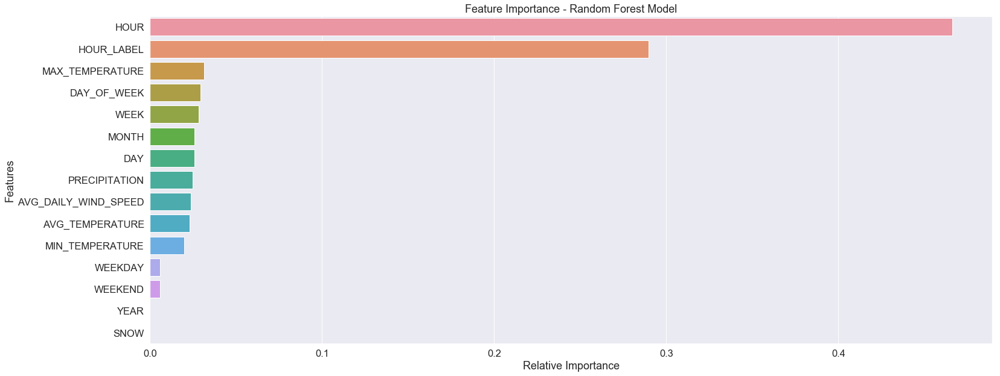

In [56]:
features, importances =  [list(t) for t in zip(*feature_imp_sort)]

plt.figure(figsize=(25,10))
sns.barplot(x=importances, y=features, data=test_results)
plt.title('Feature Importance - Random Forest Model')
plt.ylabel('Features')
plt.xlabel('Relative Importance')
plt.savefig('../../output/Final/Feature_Importance.png')


In [69]:
size = int(len(data_cell_data_hour) * 0.66)
train_1, test_1 = data_cell_data_hour[0:size], data_cell_data_hour[size:len(data_cell_data_hour)]
test_results = test_1.drop(['MONTH', 'YEAR', 'HOUR', 'DAY', 'WEEK', 'DAY_OF_WEEK',
       'WEEKEND', 'WEEKDAY',
       'AVG_DAILY_WIND_SPEED', 'PRECIPITATION', 'SNOW', 'AVG_TEMPERATURE', 'HOUR_LABEL',
       'MAX_TEMPERATURE', 'MIN_TEMPERATURE'], axis=1)
test_results.rename(columns=dict(zip(["Trip Counts"], ["Actual"])), inplace=True)
rf_list = best_rf_predictions.tolist()
test_results['rf_predictions'] = rf_list

In [70]:
test_results.index.max()

Timestamp('2019-01-14 22:00:00')

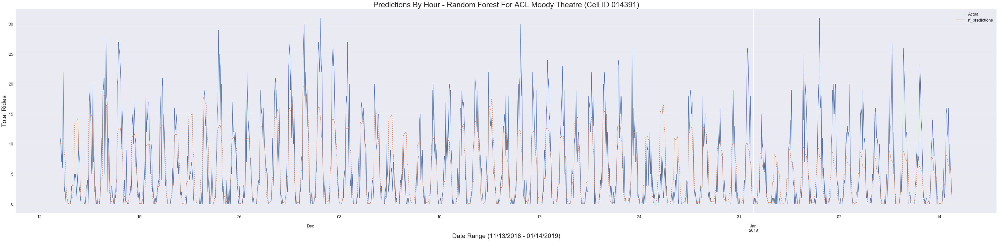

In [87]:
test_results.plot(style=['-', '--', ':'],figsize=(70, 15))
plt.title('Predictions By Hour - Random Forest For ACL Moody Theatre (Cell ID 014391)', fontsize=30)
plt.ylabel('Total Rides', fontsize=25)
plt.xlabel('Date Range (11/13/2018 - 01/14/2019)', fontsize=25)
plt.savefig('../../output/Final/Random_Forest_Predictions_Moody_Theatre_014391.png')

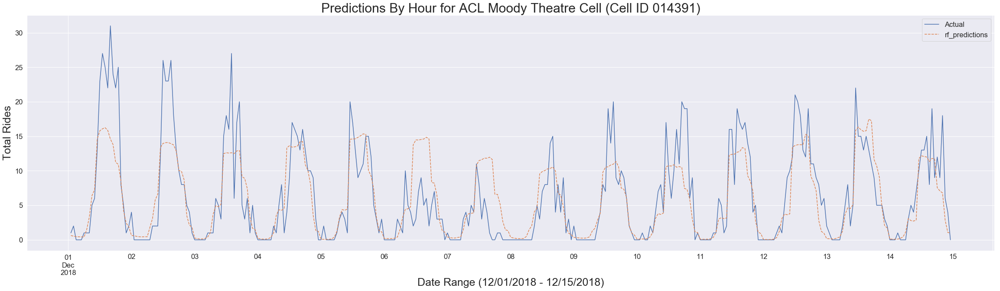

In [86]:

dec_1_dec_15 = test_results[(test_results.index > '2018-12-01') & (test_results.index < '2018-12-15')]

dec_1_dec_15.plot(style=['-', '--', ':'],figsize=(40, 10))

plt.title('Predictions By Hour for ACL Moody Theatre Cell (Cell ID 014391)', fontsize=30)
plt.ylabel('Total Rides',fontsize=25)
plt.xlabel('Date Range (12/01/2018 - 12/15/2018)', fontsize=25)
plt.savefig('../../output/Final/Random_Forest_Predictions_Moody_Theatre_014391_Dec01_Dec15.png')


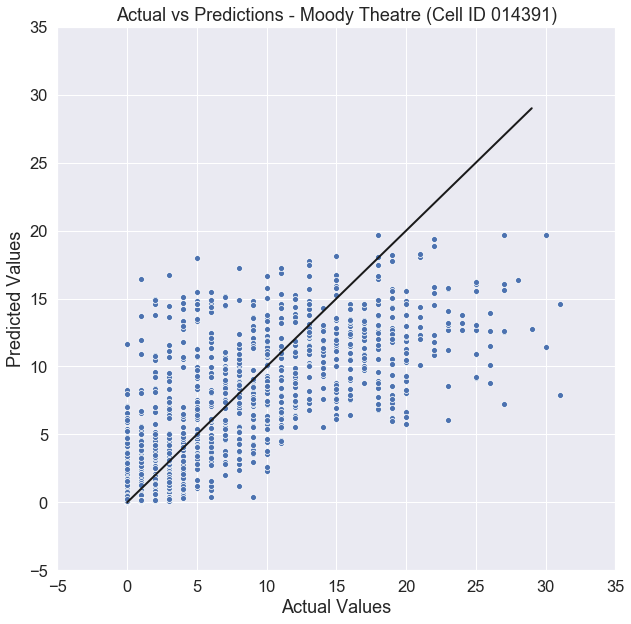

In [73]:

plt.figure(figsize=(10,10))
sns.scatterplot(x="Actual", y="rf_predictions", data=test_results)
plt.ylim(-5,35)
plt.xlim(-5,35)
plt.plot([test_results['Actual'].min(), (test_results['Actual'].max())-2], 
          [test_results['Actual'].min(),(test_results['Actual'].max()) -2], 'k', lw=2)
plt.title('Actual vs Predictions - Moody Theatre (Cell ID 014391)')
plt.ylabel('Predicted Values')
plt.xlabel('Actual Values')
plt.savefig('../../output/Final/Actual_Prediction_Summary_Moody_Theatre_014391.png')

##### Investigating why the peaks are happening in the actual values. Most of them are related to evening commute and some night hours

In [88]:
### Analyzing results for Moody_Theatre_014391 cell

t = test_results
t['DAY_OF_WEEK'] = pd.DatetimeIndex(t.index).weekday
t['WEEKEND'] = ((pd.DatetimeIndex(t.index).weekday) // 5 == 1).astype(float)
t['WEEKDAY'] = ((pd.DatetimeIndex(t.index).weekday) // 5 == 0).astype(float)
t['HOUR'] = pd.DatetimeIndex(t.index).hour
hours=[0, 6, 10, 15, 19, 23]
t['HOUR_LABEL'] = pd.cut(t['HOUR'], hours, include_lowest=True, right=True, labels=['0', '1', '2', '3', '4'])
#t_12 = t[(t['DAY_OF_WEEK'] == 5) & ((t['HOUR_LABEL'] == '3') | (t['HOUR_LABEL'] == '4'))]
hour_label_3_4 = t[((t['HOUR_LABEL'] == '3') | (t['HOUR_LABEL'] == '4'))]
hour_label_3_4

,Actual,rf_predictions,DAY_OF_WEEK,WEEKEND,WEEKDAY,HOUR,HOUR_LABEL
Start Time,,,,,,,
2018-11-13 16:00:00,22,10.889680,1,0.0,1.0,16,3
2018-11-13 17:00:00,11,10.726109,1,0.0,1.0,17,3
2018-11-13 18:00:00,2,8.428291,1,0.0,1.0,18,3
2018-11-13 19:00:00,3,7.704030,1,0.0,1.0,19,3
2018-11-13 20:00:00,1,6.695154,1,0.0,1.0,20,4
2018-11-13 21:00:00,0,2.954833,1,0.0,1.0,21,4
2018-11-13 22:00:00,0,1.009203,1,0.0,1.0,22,4
2018-11-13 23:00:00,0,0.846814,1,0.0,1.0,23,4
2018-11-14 16:00:00,4,14.190856,2,0.0,1.0,16,3


#### Grid Search for the moody theatre cell  even though the random forest parameters are from the most popular cell - 014706

In [74]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3, 5, 7, 10, 13, 14],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)


# Fit the grid search to the data
grid_search.fit(X_train, y_train)
#print("Grid Search Best Parameters:" grid_search.best_params_)

best_grid = grid_search.best_estimator_
grid_accuracy = evaluate(best_grid, X_test, y_test)


Fitting 3 folds for each of 1008 candidates, totalling 3024 fits
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=2, min

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    4.3s


[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   3.4s
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.0s
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.0s
[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.0s
[CV] bootstrap=True, max_depth=80,

[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.7s
[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   1.1s
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=

[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   5.6s
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=2

[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   5.2s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   5.0s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=3,

[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   32.1s


[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.1s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.1s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.1s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=80, max_features=3, min_

[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   1.0s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   1.0s
[CV]  bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   1.0s
[CV] bootstrap=True, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV] bootstrap=True, max_depth=80, max_features=3, min_s

[CV] bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=   1.4s
[CV] bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=   1.3s
[CV] bootstrap=True, max_depth=80, max_features=5, min_sa

[CV] bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=   4.4s
[CV] bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   0.8s
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV] bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.2s
[CV] bootstrap=True, max_depth=80, max_features=5, min_s

[CV] bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   4.2s
[CV] bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=80, max_features=5, min_sa

[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.5s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   4.2s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   1.1s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   1.0s
[CV] bootstrap=True, max_depth=80, max_features=7, min_sam

[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  1.3min


[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.4s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.4s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.3s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=7, 

[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   1.0s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   1.0s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   1.5s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   1.4s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=7

[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   1.1s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.4s
[CV] bootstrap=True, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=

[CV] bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.2s
[CV] bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.1s
[CV] bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   5.8s
[CV] bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.1s
[CV] bootstrap=True, max_depth=80, max_feat

[CV]  bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   7.0s
[CV] bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   6.6s
[CV] bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   1.3s
[CV] bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_feat

[CV] bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   6.8s
[CV] bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   7.0s
[CV] bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   6.7s
[CV] bootstrap=True, max_depth=80, max_featu

[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   2.0s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.9s
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.9s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   7.7s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_feat

[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.9s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.7s
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.7s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   6.7s
[CV] bootstrap=True, max_depth=80, max_featu

[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   2.0s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   2.0s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.9s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_fea

[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  2.8min


[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   6.4s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.7s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   6.6s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   6.5s
[CV] bootstrap=True, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=80, max_feat

[CV] bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.8s
[CV] bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.8s
[CV] bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   7.6s
[CV] bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   7.7s
[CV] bootstrap=True, max_depth=80, max_featu

[CV] bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV] bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.8s
[CV] bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.9s
[CV] bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   7.9s
[CV]  bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   7.8s
[CV] bootstrap=True, max_depth=80, max_featu

[CV] bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   2.4s
[CV] bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   2.4s
[CV] bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   1.0s
[CV] bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   1.0s
[CV] bootstrap=True, max_depth=80, max_feat

[CV] bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.0s
[CV] bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   3.2s
[CV] bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   3.3s
[CV] bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   3.2s
[CV] bootstrap=True, max_depth=90, max_features=2,

[CV] bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.0s
[CV]  bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.0s
[CV] bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV] bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   0.9s
[CV] bootstrap=True, max_depth=90, max_features=2

[CV] bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   3.2s
[CV] bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.0s
[CV] bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.0s
[CV]  bootstrap=True, max_depth=90, max_features

[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   0.8s
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   1.0s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.4s
[CV] bootstrap=True, max_depth=90, max_features=3,

[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=   4.5s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   1.2s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   1.2s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   1.1s
[CV] bootstrap=True, max_depth=90, max_features=3,

[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   0.5s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   4.3s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.8s
[CV]  bootstrap=True, max_depth=90, max_features=3,

[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.5s
[CV]  bootstrap=True, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   3.5s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.5s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=90, max_features=5, 

[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed:  4.4min


[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   4.3s
[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.3s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.2s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=5

[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   1.3s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=

[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   4.1s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=5

[CV]  bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   5.0s
[CV] bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.0s
[CV]  bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.0s
[CV] bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV] bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   4.8s
[CV] bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=7,

[CV]  bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.5s
[CV] bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   5.1s
[CV] bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   5.0s
[CV] bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   1.0s
[CV] bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=7, 

[CV]  bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.5s
[CV] bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   4.8s
[CV] bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   4.9s
[CV] bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   4.8s
[CV] bootstrap=True, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=7, 

[CV] bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.5s
[CV] bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   6.0s
[CV] bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   6.2s
[CV] bootstrap=True, max_depth=90, max_featu

[CV]  bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.8s
[CV] bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   6.1s
[CV] bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_feat

[CV] bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.7s
[CV] bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.6s
[CV] bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=90, max_feat

[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   1.3s
[CV] bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   2.0s
[CV] bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   2.0s
[CV] bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.9s
[CV] bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_fe

[CV] bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   1.2s
[CV] bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   1.3s
[CV] bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.9s
[CV] bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.8s
[CV] bootstrap=True, max_depth=90, max_fe

[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   6.5s
[CV] bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.7s
[CV] bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.4s
[CV] bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.4s
[CV] bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_f

[CV] bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.7s
[CV] bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   6.3s
[CV] bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   1.4s
[CV] bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   1.4s
[CV] bootstrap=True, max_depth=90, max_feat

[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed:  6.6min


[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   2.2s
[CV] bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   2.1s
[CV] bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   2.1s
[CV] bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.7s
[CV] bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_feature

[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   1.4s
[CV] bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV] bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   2.1s
[CV] bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   2.0s
[CV] bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   1.9s
[CV] bootstrap=True, max_depth=90, max_features=

[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   6.9s
[CV] bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   6.6s
[CV] bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=   1.0s
[CV] bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_feat

[CV] bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV] bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV] bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=   3.8s
[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=   3.8s
[CV] bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV] bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=100, max_features=2, min_sample

[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   3.2s
[CV] bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.3s
[CV] bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   3.1s
[CV] bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.6s
[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.6s
[CV] bootstrap=True, max_depth=10

[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   3.1s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   3.2s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.3s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   3.1s
[CV] bootstrap=True, max_depth=100, max_featur

[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=   4.2s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=   4.2s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_feature

[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   1.0s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   3.5s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=100, max_features=

[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.0s
[CV] bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.1s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.0s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_featur

[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.2s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.1s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.1s
[CV] bootstrap=True, max_depth=100, max_fe

[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   1.2s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_

[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   4.9s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.8s
[CV]  bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV] bootstrap=True, max_depth=100, max_fea

[CV]  bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   4.8s
[CV] bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   5.0s
[CV] bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.1s
[CV]  bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.2s
[CV] bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV] bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_fea

[CV] bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   5.1s
[CV] bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   5.0s
[CV] bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.5s
[CV] bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.9s
[CV]  bootstrap=True, max_depth=100, max_fea

[CV]  bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   4.3s
[CV] bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_fea

[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.6s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.5s
[CV] bootstrap=True, max_depth=100, 

[Parallel(n_jobs=-1)]: Done 1969 tasks      | elapsed:  8.7min


[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   5.7s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.6s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   2.4s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   2.3s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, max_depth=10

[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   1.1s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   1.1s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   1.0s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   1.6s
[CV] bootstrap=True, max_depth=100

[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   5.8s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   5.5s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   1.1s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   1.1s
[CV] bootstrap=True, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100

[CV] bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   7.2s
[CV] bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   7.4s
[CV] bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.4s
[CV] bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.4s
[CV] bootstrap=True, max_depth=100, 

[CV]  bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.9s
[CV] bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   7.9s
[CV] bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.8s
[CV] bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   8.3s
[CV] bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=100,

[CV] bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.9s
[CV] bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.8s
[CV] bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   7.7s
[CV] bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   7.5s
[CV] bootstrap=True, max_depth=100, 

[CV]  bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   2.5s
[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   2.0s
[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=100,

[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   2.1s
[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   2.1s
[CV]  bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   2.2s
[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=100, max_feature

[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.4s
[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.4s
[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   2.2s
[CV] bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   2.0s
[CV] bootstrap=True, max_depth=10

[CV]  bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   0.6s
[CV] bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.0s
[CV] bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   0.9s
[CV] bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   6.5s
[CV] bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max

[CV] bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.3s
[CV] bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=   3.1s
[CV] bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   0.6s
[CV] bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   0.6s
[CV] bootstrap=True, max_depth=110, max_fea

[CV]  bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   0.3s
[CV] bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   3.1s
[CV] bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   3.3s
[CV] bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.7s
[CV] bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_f

[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   4.1s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=110, max_fea

[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.2s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.3s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.3s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.4s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_feat

[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   1.1s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   1.1s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   0.3s
[CV] bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   0.3s
[CV] bootstrap=True, max_depth=110, max_featur

[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   0.8s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=   1.2s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=   1.3s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=   1.2s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_feature

[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   1.0s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   1.1s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.9s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   2.0s
[CV] bootstrap=True, max_depth=110, max_features=

[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   5.2s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.9s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_feature

[Parallel(n_jobs=-1)]: Done 2576 tasks      | elapsed: 11.7min


[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   6.1s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.7s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   6.1s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   1.3s
[CV] bootstrap=True, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_fea

[CV] bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.7s
[CV] bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   7.2s
[CV] bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   7.3s
[CV] bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.5s
[CV] bootstrap=True, max_depth=110, max_feat

[CV]  bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.5s
[CV] bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.5s
[CV] bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   5.5s
[CV] bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_fea

[CV] bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   2.1s
[CV] bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.7s
[CV] bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.8s
[CV] bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.8s
[CV] bootstrap=True, max_depth=110, max_feat

[CV]  bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.8s
[CV] bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.8s
[CV] bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.7s
[CV] bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.9s
[CV] bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=110

[CV]  bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   1.1s
[CV] bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV] bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.8s
[CV] bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.7s
[CV] bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.7s
[CV] bootstrap=True, max_depth=11

[CV]  bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.7s
[CV] bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.6s
[CV] bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.6s
[CV] bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   2.3s
[CV] bootstrap=True, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=1

[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.9s
[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   1.6s
[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   1.6s
[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   1.5s
[CV] bootstrap=True, max_depth=110,

[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.9s
[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=   8.5s
[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   2.0s
[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=   8.7s
[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=11

[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   6.8s
[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   7.0s
[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   1.0s
[CV] bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, max_depth=110, max_features

[CV] bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.7s
[CV] bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   6.6s
[CV] bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   6.7s
[CV] bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.8s
[CV] bootstrap=True, max_depth=110

[CV]  bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   2.1s
[CV] bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.9s
[CV] bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.7s
[CV] bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.8s
[CV] bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, max_depth=110, m

[CV] bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   3.4s
[CV] bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   3.3s
[CV] bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   3.0s
[CV] bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   0.8s
[CV] bootstrap=True, max_depth=110, max

[Parallel(n_jobs=-1)]: Done 3024 out of 3024 | elapsed: 14.5min finished


Model Performance
Mean Square Error: 20.562908278032783
Mean Absoulute Error: 2.866310754654949
Score: 0.5601115311759635


In [77]:
best_grid

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=110,
           max_features=14, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=5,
           min_samples_split=12, min_weight_fraction_leaf=0.0,
           n_estimators=300, n_jobs=1, oob_score=False, random_state=None,
           verbose=0, warm_start=False)

##### Analyzing 014706 - Elephant Room - Congress and 3rd

In [89]:
data_cell_data_hour = prepare_cell_data(dockless_data, weather_data, "014706")

In [90]:
# Create the test train split the same way as the univariate time series so this is the same as ARIMA series
size = int(len(data_cell_data_hour) * 0.66)
train, test = data_cell_data_hour[0:size], data_cell_data_hour[size:len(data_cell_data_hour)]

y_train = train.pop('Trip Counts').values
X_train = train.values
y_test = test.pop('Trip Counts').values
X_test = test.values

best_rf = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=90,
           max_features=7, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=3,
           min_samples_split=12, min_weight_fraction_leaf=0.0,
           n_estimators=100, n_jobs=1, oob_score=False, random_state=0,
           verbose=0, warm_start=False)

best_rf.fit(X_train, y_train)
best_random_forest_accuracy = evaluate(best_rf, X_test, y_test)

best_rf_predictions = best_rf.predict(X_test)

Model Performance
Mean Square Error: 44.69852825356102
Mean Absoulute Error: 4.1216013155688875
Score: 0.5257096518925966


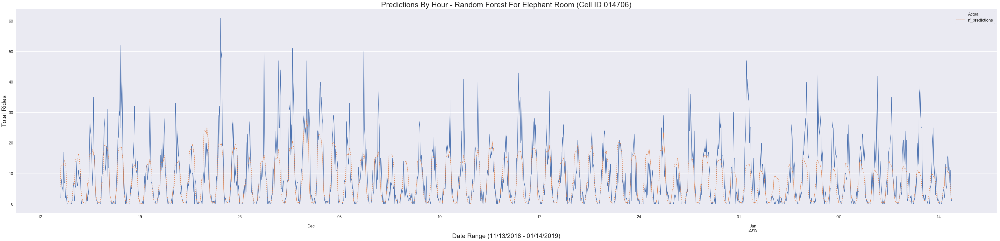

In [91]:
size = int(len(data_cell_data_hour) * 0.66)
train_1, test_1 = data_cell_data_hour[0:size], data_cell_data_hour[size:len(data_cell_data_hour)]
test_results = test_1.drop(['MONTH', 'YEAR', 'HOUR', 'DAY', 'WEEK', 'DAY_OF_WEEK',
       'WEEKEND', 'WEEKDAY',
       'AVG_DAILY_WIND_SPEED', 'PRECIPITATION', 'SNOW', 'AVG_TEMPERATURE', 'HOUR_LABEL',
       'MAX_TEMPERATURE', 'MIN_TEMPERATURE'], axis=1)
test_results.rename(columns=dict(zip(["Trip Counts"], ["Actual"])), inplace=True)
rf_list = best_rf_predictions.tolist()
test_results['rf_predictions'] = rf_list
test_results.plot(style=['-', '--', ':'],figsize=(70, 15))
plt.title('Predictions By Hour - Random Forest For Elephant Room (Cell ID 014706)', fontsize=30)
plt.ylabel('Total Rides', fontsize=25)
plt.xlabel('Date Range (11/13/2018 - 01/14/2019)', fontsize=25)
plt.savefig('../../output/Final/Random_Forest_Predictions_Elephant_Room_014706.png')


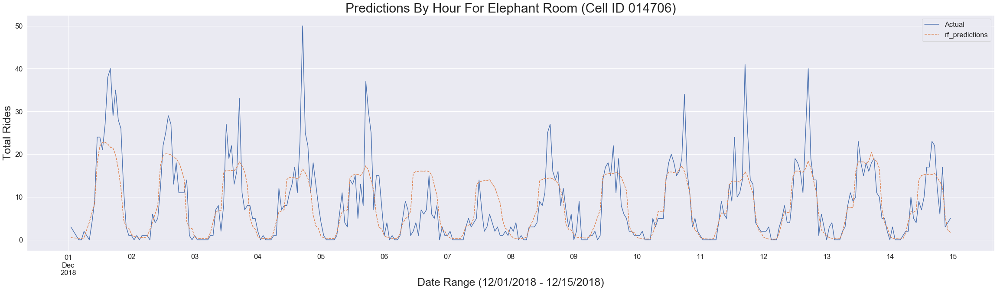

In [92]:

dec_1_dec_15 = test_results[(test_results.index > '2018-12-01') & (test_results.index < '2018-12-15')]

dec_1_dec_15.plot(style=['-', '--', ':'],figsize=(40, 10))

plt.title('Predictions By Hour For Elephant Room (Cell ID 014706)', fontsize=30)
plt.ylabel('Total Rides',fontsize=25)
plt.xlabel('Date Range (12/01/2018 - 12/15/2018)', fontsize=25)
plt.savefig('../../output/Final/Random_Forest_Predictions_Elephant_Room_014706_Dec01_Dec15.png')

In [93]:
print("Median Prediction for Elephant Room ")
print(test_results['Actual'].median())
print(test_results['rf_predictions'].median())
print("Mean Prediction for Elephant Room")
print(test_results['Actual'].mean())
print(test_results['rf_predictions'].mean())

Median Prediction for Elephant Room 
5.0
5.986026078262272
Mean Prediction for Elephant Room
8.611185086551265
7.512923533266372


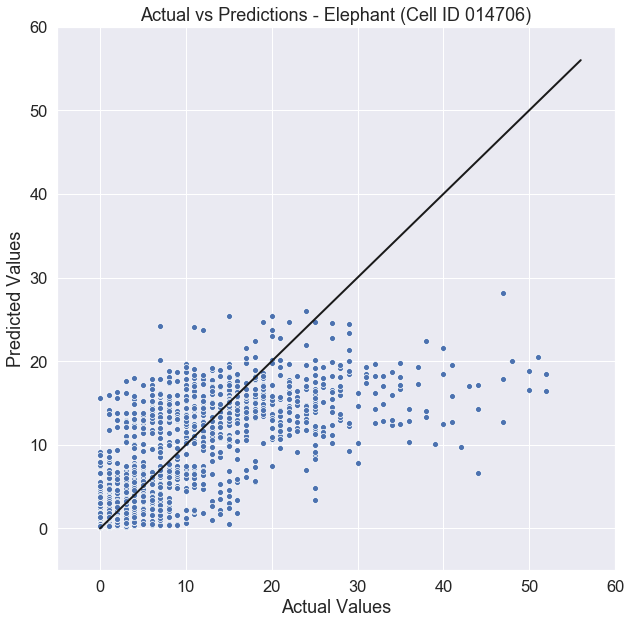

In [94]:

plt.figure(figsize=(10,10))
sns.scatterplot(x="Actual", y="rf_predictions", data=test_results)
plt.plot([test_results['Actual'].min(), (test_results['Actual'].max())-5], 
          [test_results['Actual'].min(),(test_results['Actual'].max()) -5], 'k', lw=2)
                                                                      
plt.ylim(-5,60)
plt.xlim(-5,60)
plt.title('Actual vs Predictions - Elephant (Cell ID 014706)')
plt.ylabel('Predicted Values')
plt.xlabel('Actual Values')
plt.savefig('../../output/Final/Actual_Prediction_Summary_Elephant_Room_014706.png')



#### Analyzing the peaks in cell 014706

In [95]:
### Analyzing results for Moody_Theatre_014706 cell

t = test_results
t['DAY_OF_WEEK'] = pd.DatetimeIndex(t.index).weekday
t['WEEKEND'] = ((pd.DatetimeIndex(t.index).weekday) // 5 == 1).astype(float)
t['WEEKDAY'] = ((pd.DatetimeIndex(t.index).weekday) // 5 == 0).astype(float)
t['HOUR'] = pd.DatetimeIndex(t.index).hour
hours=[0, 6, 10, 15, 19, 23]
t['HOUR_LABEL'] = pd.cut(t['HOUR'], hours, include_lowest=True, right=True, labels=['0', '1', '2', '3', '4'])
#t_12 = t[(t['DAY_OF_WEEK'] == 5) & ((t['HOUR_LABEL'] == '3') | (t['HOUR_LABEL'] == '4'))]
hour_label_3_4 = t[((t['HOUR_LABEL'] == '3') | (t['HOUR_LABEL'] == '4'))]
hour_label_3_4

,Actual,rf_predictions,DAY_OF_WEEK,WEEKEND,WEEKDAY,HOUR,HOUR_LABEL
Start Time,,,,,,,
2018-11-13 16:00:00,17,13.452509,1,0.0,1.0,16,3
2018-11-13 17:00:00,7,14.430487,1,0.0,1.0,17,3
2018-11-13 18:00:00,7,13.624366,1,0.0,1.0,18,3
2018-11-13 19:00:00,2,12.941657,1,0.0,1.0,19,3
2018-11-13 20:00:00,3,11.096931,1,0.0,1.0,20,4
2018-11-13 21:00:00,1,5.310159,1,0.0,1.0,21,4
2018-11-13 22:00:00,0,2.491821,1,0.0,1.0,22,4
2018-11-13 23:00:00,0,1.743209,1,0.0,1.0,23,4
2018-11-14 16:00:00,8,15.345250,2,0.0,1.0,16,3


#### Run the same Random Forest model for the top 10 cells

Model Performance of Cell 014706
Model Performance
Mean Square Error: 44.69852825356102
Mean Absoulute Error: 4.1216013155688875
Score: 0.5257096518925966
Actual Results Mean: 8.611185086551265
Predictions Mean: 7.512923533266372
Actual Results Median: 5.0
Predictions Median: 5.986026078262272
Model Performance of Cell 014707
Model Performance
Mean Square Error: 31.03989098384384
Mean Absoulute Error: 3.6985689912931736
Score: 0.6070794758209372
Actual Results Mean: 8.027962716378163
Predictions Mean: 7.845263315485955
Actual Results Median: 5.0
Predictions Median: 5.569986705524437
Model Performance of Cell 014864
Model Performance
Mean Square Error: 31.230080780359742
Mean Absoulute Error: 3.6451807135347183
Score: 0.5357039286028937
Actual Results Mean: 7.506666666666667
Predictions Mean: 6.854331747970784
Actual Results Median: 5.0
Predictions Median: 5.773534884280668
Model Performance of Cell 014705
Model Performance
Mean Square Error: 24.510170687746655
Mean Absoulute Error: 3.1

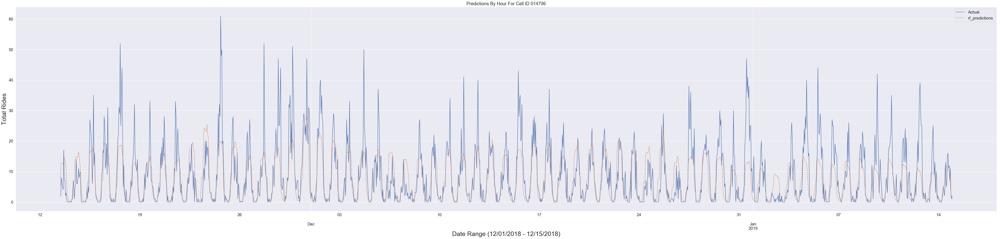

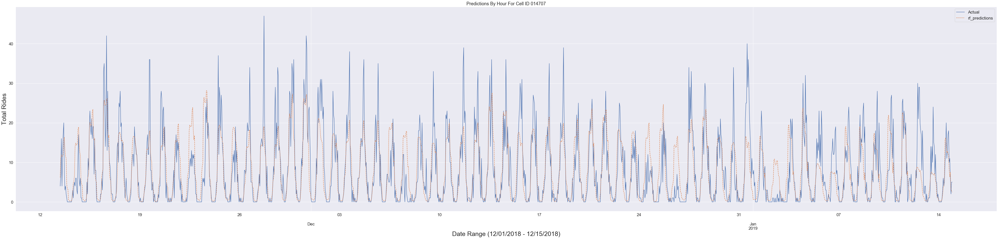

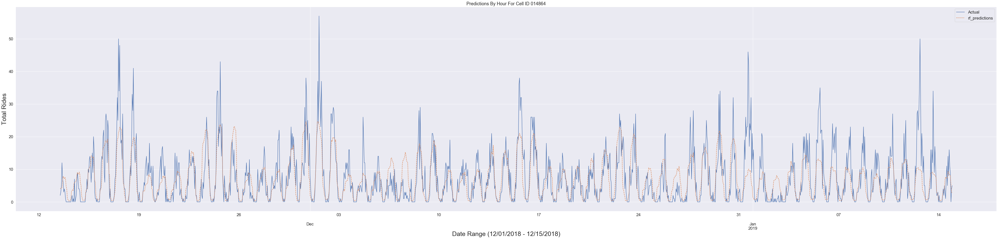

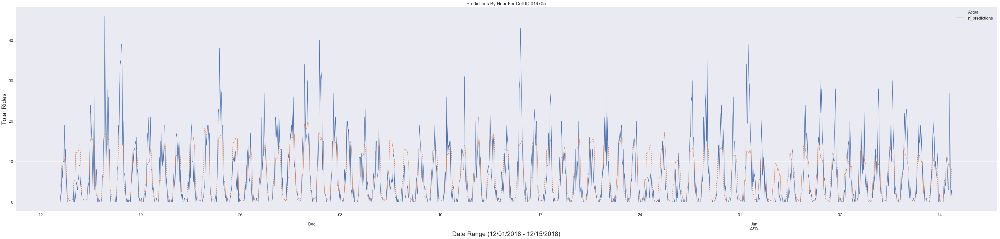

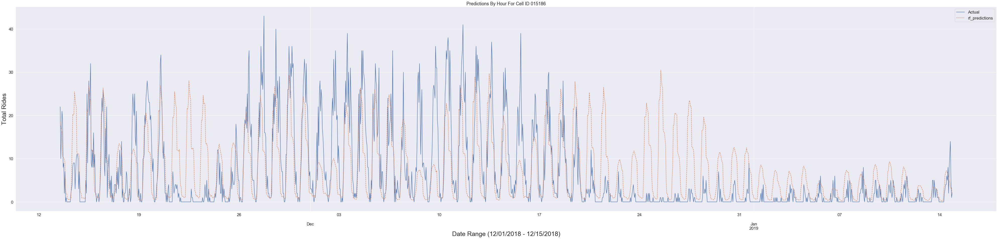

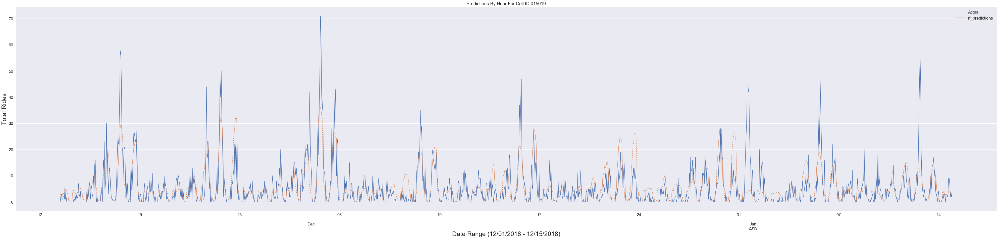

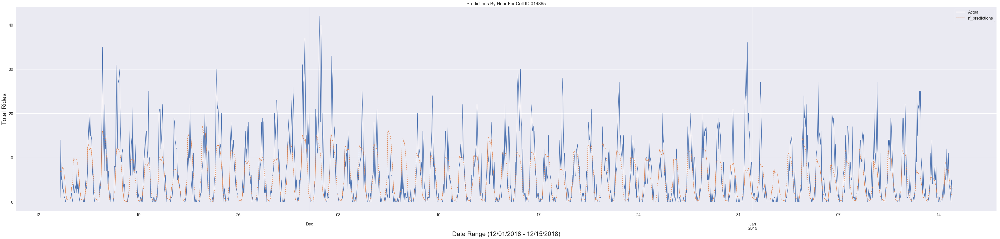

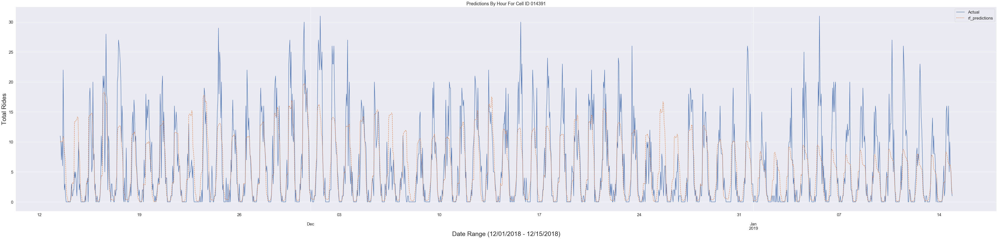

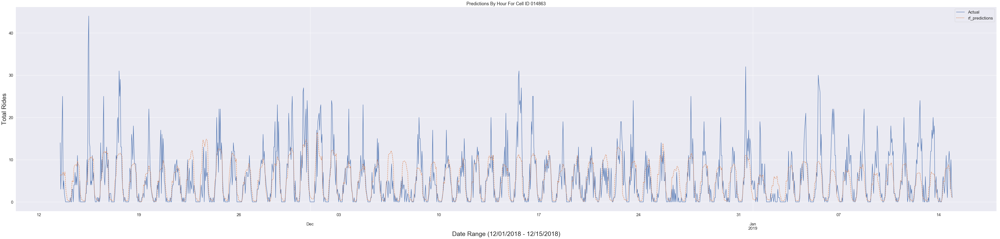

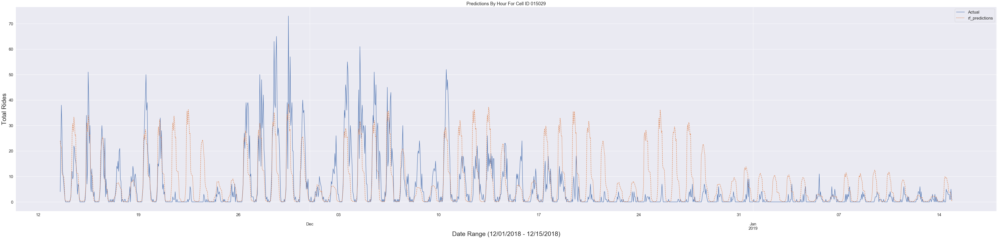

In [97]:
top_cell_list = ['014706','014707','014864','014705','015186','015019','014865','014391','014863','015029']
for item in top_cell_list:
    data_cell_data_hour = prepare_cell_data(dockless_data, weather_data, item)
    # Create the test train split the same way as the univariate time series so this is the same as ARIMA series
    size = int(len(data_cell_data_hour) * 0.66)
    train, test = data_cell_data_hour[0:size], data_cell_data_hour[size:len(data_cell_data_hour)]

    y_train = train.pop('Trip Counts').values
    X_train = train.values
    y_test = test.pop('Trip Counts').values
    X_test = test.values

    best_rf = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=90,
               max_features=7, max_leaf_nodes=None, min_impurity_decrease=0.0,
               min_impurity_split=None, min_samples_leaf=3,
               min_samples_split=12, min_weight_fraction_leaf=0.0,
               n_estimators=100, n_jobs=1, oob_score=False, random_state=0,
               verbose=0, warm_start=False)

    best_rf.fit(X_train, y_train)
    print("Model Performance of Cell {0}".format(item))

    best_random_forest_accuracy = evaluate(best_rf, X_test, y_test)
    best_rf_predictions = best_rf.predict(X_test)
   
    size = int(len(data_cell_data_hour) * 0.66)
    train_1, test_1 = data_cell_data_hour[0:size], data_cell_data_hour[size:len(data_cell_data_hour)]
    test_results = test_1.drop(['MONTH', 'YEAR', 'HOUR', 'DAY', 'WEEK', 'DAY_OF_WEEK',
           'WEEKEND', 'WEEKDAY',
           'AVG_DAILY_WIND_SPEED', 'PRECIPITATION', 'SNOW', 'AVG_TEMPERATURE', 'HOUR_LABEL',
           'MAX_TEMPERATURE', 'MIN_TEMPERATURE'], axis=1)
    test_results.rename(columns=dict(zip(["Trip Counts"], ["Actual"])), inplace=True)
    rf_list = best_rf_predictions.tolist()
    test_results['rf_predictions'] = rf_list
    
    print("Actual Results Mean: {0}".format(test_results['Actual'].mean()))
    print("Predictions Mean: {0}".format(test_results['rf_predictions'].mean()))
    print("Actual Results Median: {0}".format(test_results['Actual'].median()))
    print("Predictions Median: {0}".format(test_results['rf_predictions'].median()))

    test_results.plot(style=['-', '--', ':'],figsize=(70, 15))
    plt.title("Predictions By Hour For Cell ID {0}".format(item))
    plt.ylabel('Total Rides',fontsize=25)
    plt.xlabel('Date Range (12/01/2018 - 12/15/2018)', fontsize=25)
    filename = "../../output/Final/Random_Forest_Predictions_{0}_.png".format(item)
    plt.savefig(filename)
       

##### Model Performance of Cell 014706
    Model Performance
    Mean Square Error: 44.69852825356102
    Mean Absoulute Error: 4.1216013155688875
    Score: 0.5257096518925966
    Actual Results Mean: 8.611185086551265
    Predictions Mean: 7.512923533266372
    Actual Results Median: 5.0
    Predictions Median: 5.986026078262272
    
    
##### Model Performance of Cell 014707
    Model Performance
    Mean Square Error: 31.03989098384384
    Mean Absoulute Error: 3.6985689912931736
    Score: 0.6070794758209372
    Actual Results Mean: 8.027962716378163
    Predictions Mean: 7.845263315485955
    Actual Results Median: 5.0
    Predictions Median: 5.569986705524437

##### Model Performance of Cell 014864
    Model Performance
    Mean Square Error: 31.230080780359742
    Mean Absoulute Error: 3.6451807135347183
    Score: 0.5357039286028937
    Actual Results Mean: 7.506666666666667
    Predictions Mean: 6.854331747970784
    Actual Results Median: 5.0
    Predictions Median: 5.773534884280668

##### Model Performance of Cell 014705
    Model Performance
    Mean Square Error: 24.510170687746655
    Mean Absoulute Error: 3.1511167124197668
    Score: 0.567396233386424
    Actual Results Mean: 6.200532978014657
    Predictions Mean: 6.367707166460898
    Actual Results Median: 3.0
    Predictions Median: 5.549280740973854

### Model Performance of Cell 015186
    Model Performance
    Mean Square Error: 64.28464124877694
    Mean Absoulute Error: 5.3672448845529335
    Score: 0.24882400189455167
    Actual Results Mean: 6.549399198931909
    Predictions Mean: 7.4026571470395455
    Actual Results Median: 2.0
    Predictions Median: 4.088995971623462

##### Model Performance of Cell 015019
    Model Performance
    Mean Square Error: 35.59449504948863
    Mean Absoulute Error: 3.4768993110885176
    Score: 0.4826633940503422
    Actual Results Mean: 5.617842876165113
    Predictions Mean: 5.8454982369838016
    Actual Results Median: 3.0
    Predictions Median: 3.9928997693548354

##### Model Performance of Cell 014865
    Model Performance
    Mean Square Error: 26.704245232950285
    Mean Absoulute Error: 3.277778557901338
    Score: 0.45883764865246146
    Actual Results Mean: 6.225483655770514
    Predictions Mean: 5.076565469436607
    Actual Results Median: 4.0
    Predictions Median: 3.7061183092878913

##### Model Performance of Cell 014391
    Model Performance
    Mean Square Error: 18.45461480165581
    Mean Absoulute Error: 2.7454699528693496
    Score: 0.6052128357490097
    Actual Results Mean: 5.898666666666666
    Predictions Mean: 5.302398564866593
    Actual Results Median: 3.0
    Predictions Median: 3.5480839009071268

##### Model Performance of Cell 014863
    Model Performance
    Mean Square Error: 18.451079722600486
    Mean Absoulute Error: 2.7182176099803863
    Score: 0.4960142217119326
    Actual Results Mean: 5.314666666666667
    Predictions Mean: 4.884264574342746
    Actual Results Median: 3.0
    Predictions Median: 4.696610532575889

### Model Performance of Cell 015029
    Model Performance
    Mean Square Error: 84.89031591703511
    Mean Absoulute Error: 5.310513437714368
    Score: 0.1991362193282109
    Actual Results Mean: 5.423230974632844
    Predictions Mean: 7.0445466113214295
    Actual Results Median: 1.0
    Predictions Median: 2.5736063333035926



In [ ]:
# SARIMA Model Grid Search. Always took a long time to run and had to stop before it finished
data_014706_hourly = data_cell_data_hour['Trip Counts']
data = data_014706_hourly.values
data = data.astype('float32')
print(data.shape)
# data split
n_test = 3800
# model configs
cfg_list = sarima_configs()
# grid search
scores = grid_search(data, cfg_list, n_test,parallel=False)
print('done')
# list top 3 configs
for cfg, error in scores[:3]:
    print(cfg, error)

(4414,)
 > Model[[(0, 0, 0), (0, 0, 0, 0), 'n']] 5.001
 > Model[[(0, 0, 0), (0, 0, 1, 0), 'n']] 3.936
 > Model[[(0, 0, 0), (0, 0, 2, 0), 'n']] 3.565
 > Model[[(0, 0, 0), (1, 0, 0, 0), 'n']] 3.176
 > Model[[(0, 0, 0), (1, 0, 1, 0), 'n']] 3.089
 > Model[[(0, 0, 0), (1, 0, 2, 0), 'n']] 3.084
 > Model[[(0, 0, 0), (2, 0, 0, 0), 'n']] 3.088
 > Model[[(0, 0, 0), (2, 0, 1, 0), 'n']] 3.086
 > Model[[(0, 0, 0), (2, 0, 2, 0), 'n']] 3.069
 > Model[[(0, 0, 0), (0, 0, 0, 0), 'c']] 4.130
 > Model[[(0, 0, 0), (0, 0, 1, 0), 'c']] 3.471
 > Model[[(0, 0, 0), (0, 0, 2, 0), 'c']] 3.251
 > Model[[(0, 0, 0), (1, 0, 0, 0), 'c']] 3.081
 > Model[[(0, 0, 0), (1, 0, 1, 0), 'c']] 3.032
 > Model[[(0, 0, 0), (1, 0, 2, 0), 'c']] 3.024
 > Model[[(0, 0, 0), (0, 0, 1, 0), 't']] 3.626


##### CHI-SQUARE TEST FOR DOWNTOWN AND UT CELLS

In [99]:
# CHI-SQUARED TEST

downtown_6_congress_cell_data_hour = prepare_cell_data(dockless_data, weather_data, "014707")
ut_greogory_gym_cell_data_hour = prepare_cell_data(dockless_data, weather_data, "015029")

down_town_counts = downtown_6_congress_cell_data_hour[['Trip Counts']]
down_town_counts['HOUR'] = pd.DatetimeIndex(down_town_counts.index).hour
hours=[0, 6, 10, 15, 19, 23]
down_town_counts['HOUR_LABEL'] = pd.cut(down_town_counts['HOUR'], hours, include_lowest=True, right=True, labels=['0', '1', '2', '3', '4'])
down_town_counts.drop(['HOUR'], axis=1, inplace=True)
downtown_counts = (down_town_counts.groupby('HOUR_LABEL').sum())['Trip Counts']

ut_greogory_gym_cell_data_counts = ut_greogory_gym_cell_data_hour[['Trip Counts']]
ut_greogory_gym_cell_data_counts['HOUR'] = pd.DatetimeIndex(ut_greogory_gym_cell_data_counts.index).hour
hours=[0, 6, 10, 15, 19, 23]
ut_greogory_gym_cell_data_counts['HOUR_LABEL'] = pd.cut(ut_greogory_gym_cell_data_counts['HOUR'], hours, include_lowest=True, right=True, labels=['0', '1', '2', '3', '4'])
ut_greogory_gym_cell_data_counts.drop(['HOUR'], axis=1, inplace=True)
ut_counts = (ut_greogory_gym_cell_data_counts.groupby('HOUR_LABEL').sum())['Trip Counts']

print("Downtown Counts")
print(downtown_counts)

print("UT Counts")
print(ut_counts)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3694: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors

Downtown Counts
HOUR_LABEL
0      658
1     3690
2    17517
3    12894
4     3660
Name: Trip Counts, dtype: int64
UT Counts
HOUR_LABEL
0      184
1     5028
2    12787
3     5527
4     1468
Name: Trip Counts, dtype: int64


In [101]:

# chi-squared test with similar proportions
from scipy.stats import chi2_contingency
from scipy.stats import chi2
# contingency table
table = [[658, 3690, 17517,12984,3660],[184,5028,12787,5527,1486]]
print("contingency table")
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('degrees of freedom =%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

contingency table
[[658, 3690, 17517, 12984, 3660], [184, 5028, 12787, 5527, 1486]]
degrees of freedom =4
[[  510.45446388  5285.20429464 18371.51077596 11222.11707939
   3119.71338612]
 [  331.54553612  3432.79570536 11932.48922404  7288.88292061
   2026.28661388]]
probability=0.950, critical=9.488, stat=2372.138
Dependent (reject H0)
significance=0.050, p=0.000
Dependent (reject H0)


#### Univariate Time Series

In [10]:
def plot_trend_data(ax, name, series):
    ax.plot(series.index, series)
    ax.set_title("Dockless Scooter Trend For {}".format(name))

def to_col_vector(arr):
    """Convert a one dimensional numpy array to a column vector."""
    return arr.reshape(-1, 1)

def make_design_matrix(arr):
    """Construct a design matrix from a numpy array, including an intercept term."""
    return sm.add_constant(to_col_vector(arr), prepend=False)

def fit_linear_trend(series):
    """Fit a linear trend to a time series.  Return the fit trend as a numpy array."""
    X = make_design_matrix(np.arange(len(series)) + 1)
    linear_trend_ols = sm.OLS(series.values, X).fit()
    linear_trend = linear_trend_ols.predict(X)
    return linear_trend

def plot_linear_trend(ax, name, series):
    linear_trend = fit_linear_trend(series)
    plot_trend_data(ax, name, series)
    ax.plot(series.index, linear_trend)
    
def fit_moving_average_trend(series, window=6):
    return series.rolling(window, center=True).mean()

def plot_moving_average_trend(ax, name, series, window=6):
    moving_average_trend = fit_moving_average_trend(series, window)
    plot_trend_data(ax, name, series)
    ax.set_title("Dockless Scooter Moving Average Trend For {}".format(name))
    ax.plot(series.index, moving_average_trend)
    
def create_monthly_dummies(series):
    month = series.index.month
    # Only take 11 of the 12 dummies to avoid strict colinearity.
    return pd.get_dummies(month).ix[:, :11]

def fit_seasonal_trend(series):
    dummies = create_monthly_dummies(series)
    X = sm.add_constant(dummies.values, prepend=False)
    seasonal_model = sm.OLS(series.values, X).fit()
    return seasonal_model.predict(X)

def plot_seasonal_trend(ax, name, series):
    seasons_average_trend = fit_seasonal_trend(series)
    plot_trend_data(ax, name, series)
    ax.set_title("Dockless Scooter Seasonality Trend For {}".format(name))
    ax.plot(series.index, seasons_average_trend)
    
def plot_seasonal_decomposition(axs, series, sd):
    axs[0].plot(series.index, series)
    axs[0].set_title("Raw Series")
    axs[1].plot(series.index, sd.trend)
    axs[1].set_title("Trend Component $T_t$")
    axs[2].plot(series.index, sd.seasonal)
    axs[2].set_title("Seasonal Component $S_t$")
    axs[3].plot(series.index, sd.resid)
    axs[3].set_title("Residual Component $R_t$")
    
def plot_series_and_difference(axs, series, title):
    diff = series.diff()
    axs[0].plot(series.index, series)
    axs[0].set_title("Raw Series: {}".format(title))
    axs[1].plot(series.index, diff)
    axs[1].set_title("Series of First Differences: {}".format(title))
    
def series_and_lagged(series, lag=1):
    truncated = np.copy(series)[lag:]
    lagged = np.copy(series)[:(len(truncated))]
    return truncated, lagged

def compute_autocorrelation(series, lag=1):
    series, lagged = series_and_lagged(series, lag=lag)
    return np.corrcoef(series, lagged)[0, 1]

def format_list_of_floats(L):
    return ["{0:2.2f}".format(f) for f in L]

In [11]:
### SARIMA Model

# one-step sarima forecast
def sarima_forecast(history, config):
    order, sorder, trend = config
    # define model
    model = SARIMAX(history, order=order, seasonal_order=sorder, trend=trend, enforce_stationarity=False, enforce_invertibility=False)
    # fit model
    model_fit = model.fit(disp=False)
    # make one step forecast
    yhat = model_fit.predict(len(history), len(history))
    return yhat[0]

# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
    return data[:-n_test], data[-n_test:]

# root mean squared error or rmse
def measure_rmse(actual, predicted):
    return sqrt(mean_squared_error(actual, predicted))

# walk-forward validation for univariate data
def walk_forward_validation(data, n_test, cfg):
    predictions = list()
    # split dataset
    train, test = train_test_split(data, n_test)
    # seed history with training dataset
    history = [x for x in train]
    # step over each time-step in the test set
    for i in range(len(test)):
        # fit model and make forecast for history
        yhat = sarima_forecast(history, cfg)
        # store forecast in list of predictions
        predictions.append(yhat)
        # add actual observation to history for the next loop
        history.append(test[i])
    # estimate prediction error
    error = measure_rmse(test, predictions)
    return error

# score a model, return None on failure
def score_model(data, n_test, cfg, debug=False):
    result = None
    # convert config to a key
    key = str(cfg)
    # show all warnings and fail on exception if debugging
    if debug:
        result = walk_forward_validation(data, n_test, cfg)
    else:
        # one failure during model validation suggests an unstable config
        try:
            # never show warnings when grid searching, too noisy
            with catch_warnings():
                filterwarnings("ignore")
                result = walk_forward_validation(data, n_test, cfg)
        except:
            error = None
    # check for an interesting result
    if result is not None:
        print(' > Model[%s] %.3f' % (key, result))
    return (key, result)

# grid search configs
def grid_search(data, cfg_list, n_test, parallel=True):
    scores = None
    if parallel:
        # execute configs in parallel
        executor = Parallel(n_jobs=cpu_count(), backend='multiprocessing')
        tasks = (delayed(score_model)(data, n_test, cfg) for cfg in cfg_list)
        scores = executor(tasks)
    else:
        scores = [score_model(data, n_test, cfg) for cfg in cfg_list]
    # remove empty results
    scores = [r for r in scores if r[1] != None]
    # sort configs by error, asc
    scores.sort(key=lambda tup: tup[1])
    return scores

# create a set of sarima configs to try
def sarima_configs(seasonal=[0]):
    models = list()
    # define config lists
    p_params = [0, 1, 2]
    d_params = [0, 1]
    q_params = [0, 1, 2]
    t_params = ['n','c','t','ct']
    P_params = [0, 1, 2]
    D_params = [0, 1]
    Q_params = [0, 1, 2]
    m_params = seasonal
    # create config instances
    for p in p_params:
        for d in d_params:
            for q in q_params:
                for t in t_params:
                    for P in P_params:
                        for D in D_params:
                            for Q in Q_params:
                                for m in m_params:
                                    cfg = [(p,d,q), (P,D,Q,m), t]
                                    models.append(cfg)
    return models

In [12]:
data_cell_data_hour_014706 = prepare_cell_data(dockless_data, weather_data, "014706")
data_time_series_014706 = (data_cell_data_hour_014706['Trip Counts']).to_frame()

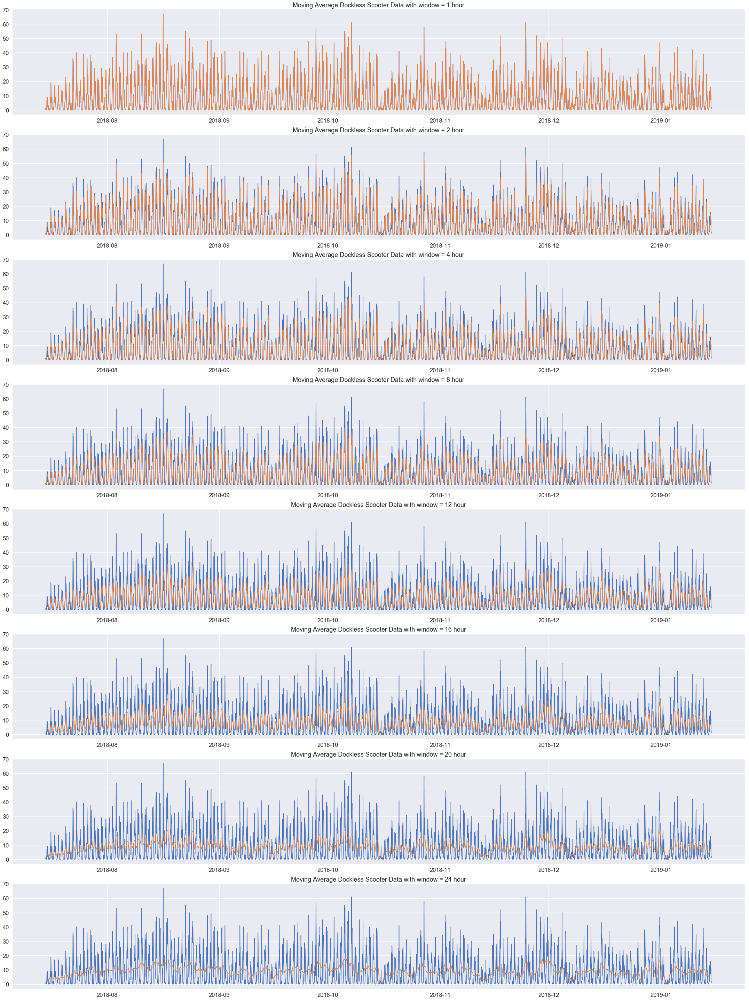

In [13]:
fig, axs = plt.subplots(8, figsize=(30, 40))

for i, window in enumerate([1, 2, 4, 8, 12, 16, 20, 24]):
    axs[i].plot(data_time_series_014706.index, data_time_series_014706)
    axs[i].plot(data_time_series_014706.index, fit_moving_average_trend(data_time_series_014706, window=window))
    axs[i].set_title("Moving Average Dockless Scooter Data with window = {} hour".format(window))
      
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Moving_Average_014706.png") 
plt.tight_layout()


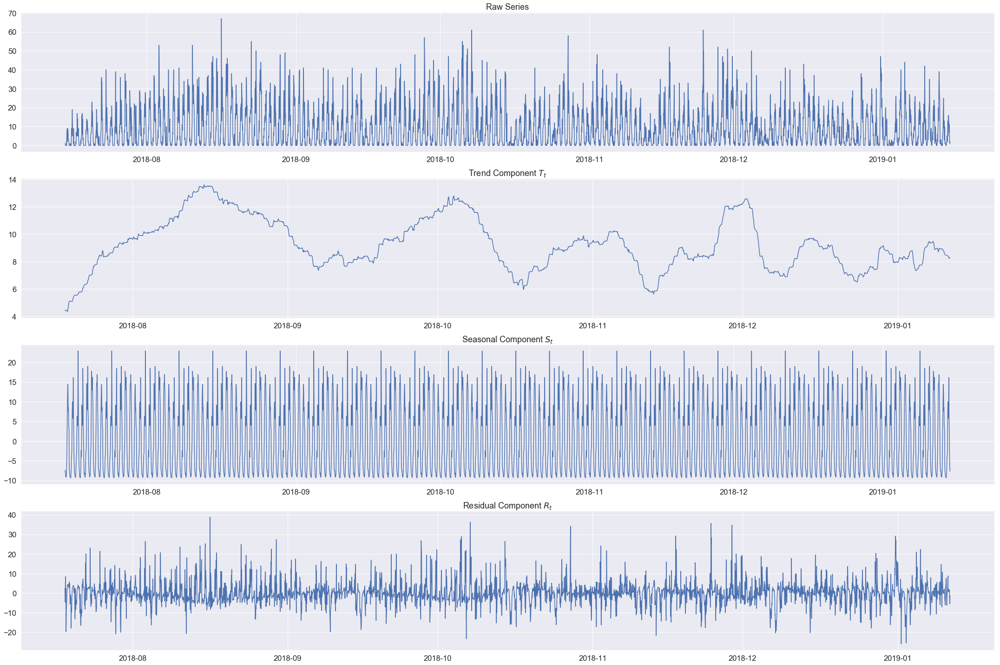

In [15]:
data_time_series_014706_decomposition = sm.tsa.seasonal_decompose(data_time_series_014706, freq=(24*7))

fig, axs = plt.subplots(4, figsize=(30, 20))
plot_seasonal_decomposition(axs, data_time_series_014706, data_time_series_014706_decomposition)
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Seasonal_Decomposition_014706.png") 
plt.tight_layout()

In [16]:
# Augmented Dickey-Fuller test 

test = sm.tsa.stattools.adfuller(data_time_series_014706['Trip Counts'])
print("ADF p-value for 014706 series: {0:2.2f}".format(test[1]))

test = sm.tsa.stattools.adfuller(data_time_series_014706['Trip Counts'].diff()[1:])
print("ADF p-value for differenced python series: {0:2.2f}".format(test[1]))

ADF p-value for 014706 series: 0.00
ADF p-value for differenced python series: 0.00


In [17]:
hourly_014706_diff = data_time_series_014706['Trip Counts'].diff()[1:]

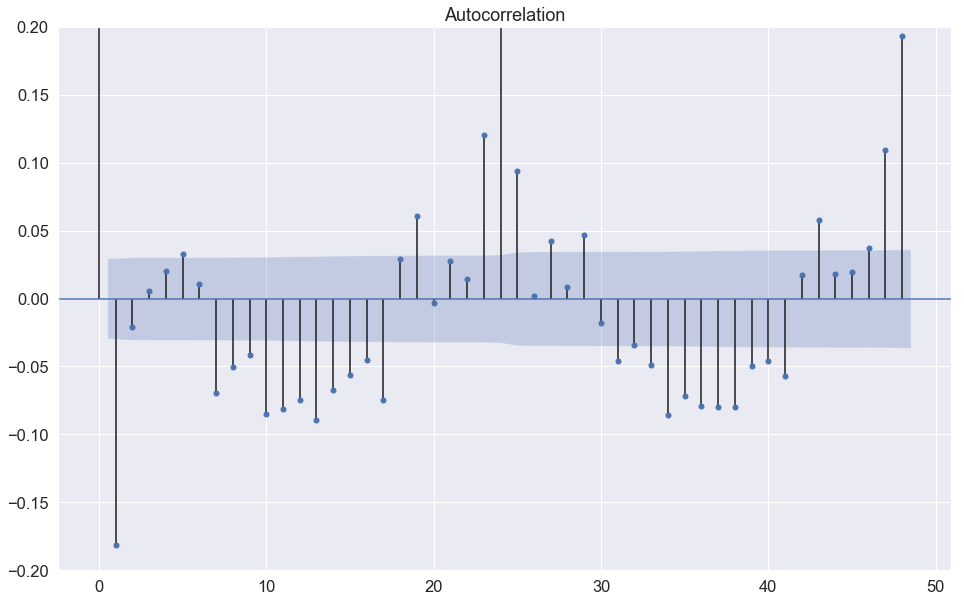

In [18]:
## Lags is 2*24 - 24 hours

fig, ax = plt.subplots(1, figsize=(16, 10))

_ = sm.graphics.tsa.plot_acf(hourly_014706_diff, lags=2*24, ax=ax)
ax.set_ylim([-0.2,0.2])
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Auto_Correlation_014706.png") 


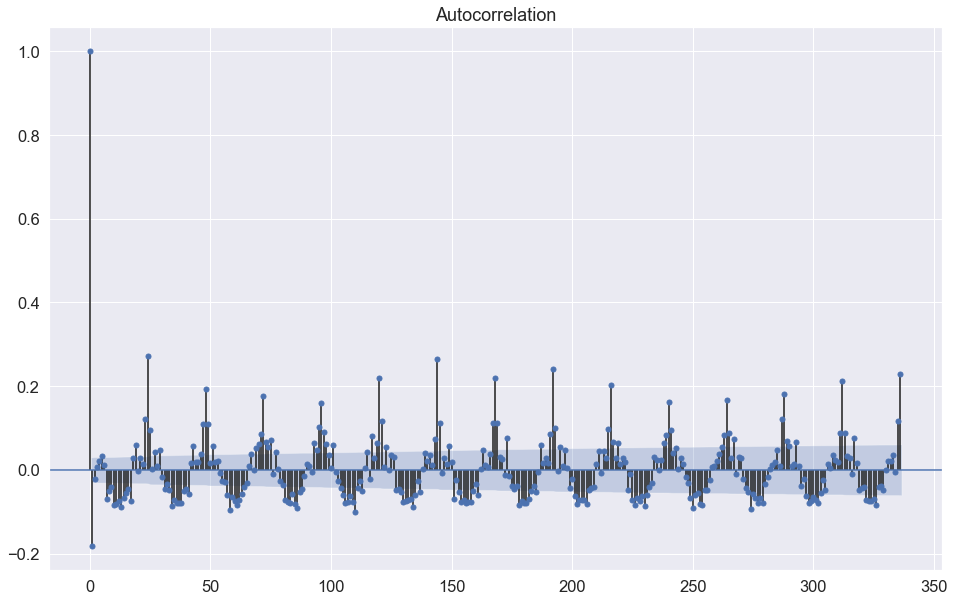

In [19]:
## Lags is 24 - 24 hours

fig, ax = plt.subplots(1, figsize=(16, 10))

_ = sm.graphics.tsa.plot_acf(hourly_014706_diff, lags=14*24, ax=ax)
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Auto_Correlation_014706_Two_Weeks.png") 
#ax.set_ylim([-0.2,0.2])

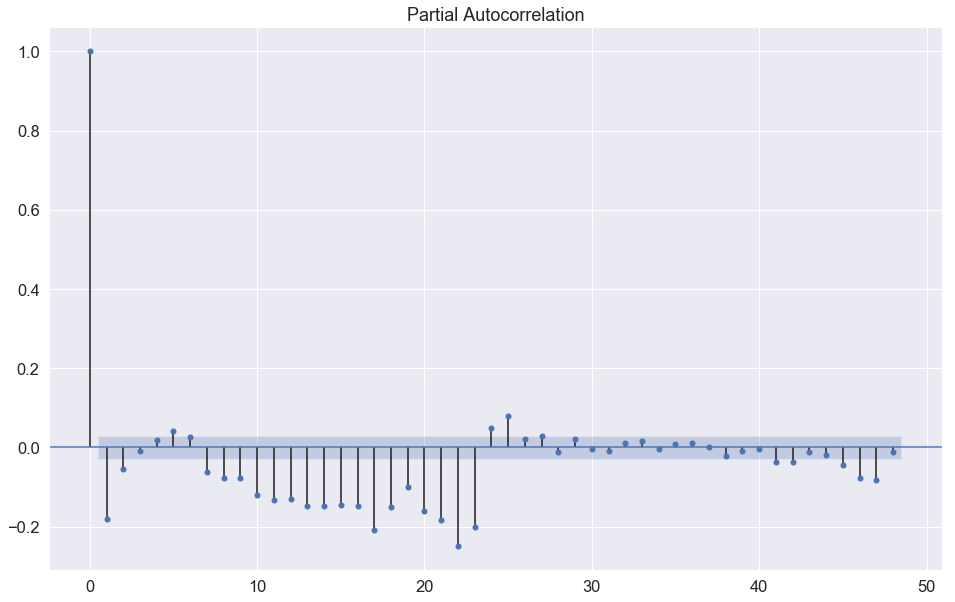

In [20]:
# Lags is 24 - 24 hours

fig, ax = plt.subplots(1, figsize=(16, 10))

_ = sm.graphics.tsa.plot_pacf(hourly_014706_diff, lags=2*24, ax=ax, method='ywmle')
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Partial_Auto_Correlation_2_days_014706.png") 

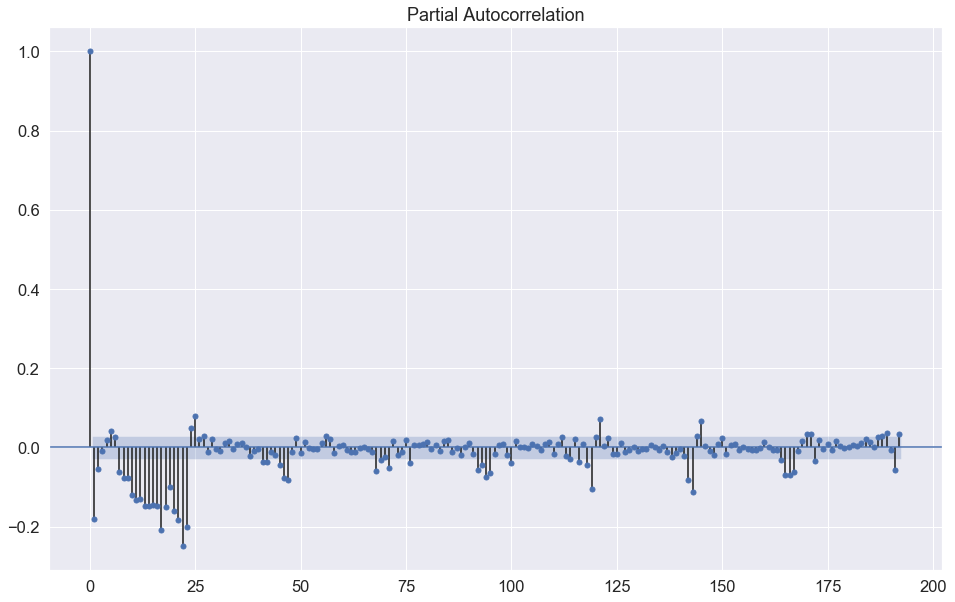

In [21]:
# Lags is 24 - 24 hours

fig, ax = plt.subplots(1, figsize=(16, 10))

_ = sm.graphics.tsa.plot_pacf(hourly_014706_diff, lags=8*24, ax=ax, method='ywmle')
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Partial_Auto_Correlation_8_days_014706.png") 

In [22]:
X = data_time_series_014706['Trip Counts']

size = int(len(X) * 0.75)
train, test = X[0:size], X[size:len(X)]
model = SARIMAX(train, order=(2, 1, 1), seasonal_order=(2, 0, 2, 24)).fit()

/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  % freq, ValueWarning)


In [112]:
model

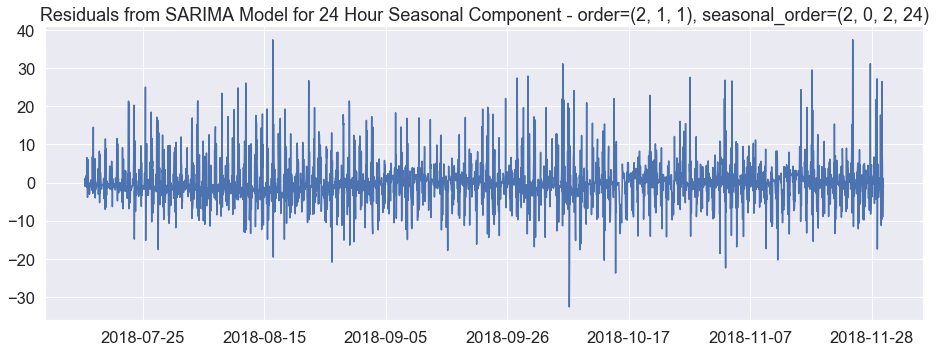

In [23]:
fig, ax = plt.subplots(1, figsize=(14, 5))
ax.plot(model.resid.index, model.resid)
ax.set_title("Residuals from SARIMA Model for 24 Hour Seasonal Component - order=(2, 1, 1), seasonal_order=(2, 0, 2, 24)")
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Residuals_SARIMA_014706.png")
plt.tight_layout()

Text(0.5,106.5,'Date Range (11/29/2018 - 01/30/2019)')

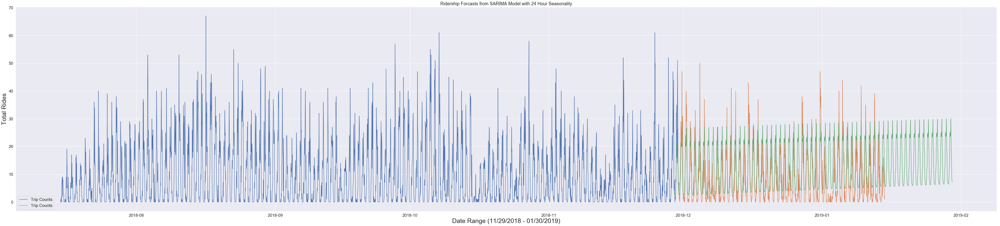

In [25]:
fig, ax = plt.subplots(1, figsize=(70, 15))
ax.plot(train.index, train)
ax.plot(test)
preds = model.predict('2018-11-29', '2019-01-30', dynamic=True, ax=ax, plot_insample=False)

ax.plot(preds.index, preds)

_ = ax.legend().get_texts()[1].set_text("95% Prediction Interval")
_ = ax.legend(loc="lower left")

_ = ax.set_title("Ridership Forcasts from SARIMA Model with 24 Hour Seasonality")
#ax.set_xlim([0, 40])
#ax.set_ylim([2.4, 3.5])
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/SARIMA_Forecast_24hour_Seasonal_014706.png") 
ax.set_ylabel("Total Rides",fontsize=25)
ax.set_xlabel("Date Range (11/29/2018 - 01/30/2019)", fontsize=25)


In [130]:
## This cell does not run. Gives LU Decomposition Error

X = data_time_series_014706['Trip Counts'].values
X = X.astype('float32')
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
sarima_predictions = list()
for t in range(len(test)):
    #model = ARIMA(history, order=(0,1,2))
    model = SARIMAX(endog=history, order=(2, 1, 1), seasonal_order=(2, 0, 2, 24))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    sarima_predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
error = mean_squared_error(test, sarima_predictions)
print('Test MSE: %.3f' % error)
# plot
# plt.plot(test)
# plt.plot(predictions, color='red')
# plt.show()

predicted=7.559196, expected=2.000000
predicted=10.441402, expected=2.000000


/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:507: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


predicted=12.897964, expected=8.000000
predicted=11.640159, expected=6.000000


/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:507: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


predicted=10.694180, expected=5.000000
predicted=9.407209, expected=4.000000
predicted=9.494161, expected=17.000000


/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:507: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


predicted=18.174409, expected=7.000000


/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:507: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


predicted=9.151919, expected=7.000000
predicted=6.028824, expected=2.000000


LinAlgError: LU decomposition error.

/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  % freq, ValueWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:507: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Text(0.5,61.5,'Date Range (11/29/2018 - 01/30/2019)')

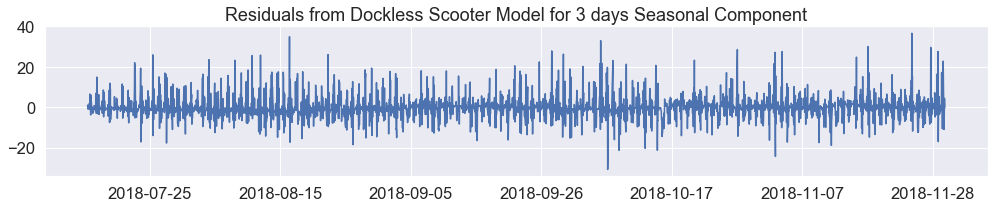

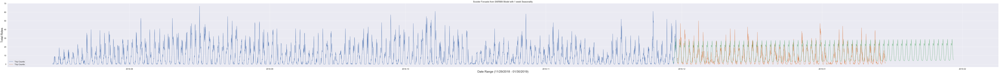

In [26]:
# Run the SARIMA with 1 week seasonality
X = data_time_series_014706['Trip Counts']
#X = X.astype('float32')

size = int(len(X) * 0.75)
train, test = X[0:size], X[size:len(X)]
model = SARIMAX(train, order=(2, 1, 1), seasonal_order=(3, 0, 2, 24)).fit()
fig, ax = plt.subplots(1, figsize=(14, 3))
ax.plot(model.resid.index, model.resid)
ax.set_title("Residuals from Dockless Scooter Model for 3 days Seasonal Component")
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/SARIMA_Residuals_3days_Seasonal_014706.png") 
plt.tight_layout()

fig, ax = plt.subplots(1, figsize=(70, 15))
ax.plot(train.index, train)
ax.plot(test)
preds = model.predict('2018-11-29', '2019-01-30', dynamic=True, ax=ax, plot_insample=False)

ax.plot(preds.index, preds)

_ = ax.legend().get_texts()[1].set_text("95% Prediction Interval")
_ = ax.legend(loc="lower left")

_ = ax.set_title("Scooter Forcasts from SARIMA Model with 1 week Seasonality")
#ax.set_xlim([0, 40])
#ax.set_ylim([2.4, 3.5])
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/SARIMA_Forecast_3days_Seasonal_014706.png") 
ax.set_ylabel("Total Rides",fontsize=25)
ax.set_xlabel("Date Range (11/29/2018 - 01/30/2019)", fontsize=25)

Text(0.5,106.5,'Date Range (11/29/2018 - 01/30/2019)')

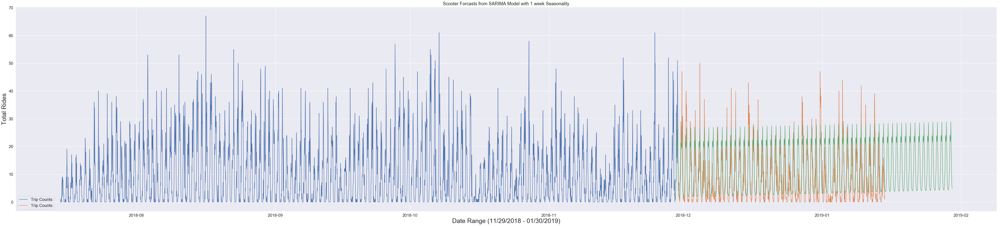

In [28]:
fig, ax = plt.subplots(1, figsize=(70, 15))
ax.plot(train.index, train)
ax.plot(test)
preds = model.predict('2018-11-29', '2019-01-30', dynamic=True, ax=ax, plot_insample=False)

ax.plot(preds.index, preds)

_ = ax.legend().get_texts()[1].set_text("95% Prediction Interval")
_ = ax.legend(loc="lower left")

_ = ax.set_title("Scooter Forcasts from SARIMA Model with 1 week Seasonality")
#ax.set_xlim([0, 40])
#ax.set_ylim([2.4, 3.5])
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/SARIMA_Forecast_3days_Seasonal_014706.png") 
ax.set_ylabel("Total Rides",fontsize=25)
ax.set_xlabel("Date Range (11/29/2018 - 01/30/2019)", fontsize=25)

In [31]:
sarima_predictions = model.predict('2018-11-29', '2019-01-15', dynamic=True, ax=ax, plot_insample=False)

##### ARIMA Models - AR and MA

In [33]:
# Auto Rregressor Model

X = data_time_series_014706['Trip Counts']
X = X.astype('float32')
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
ar_predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(2,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    ar_predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
error = mean_squared_error(test, ar_predictions)
print('Test MSE: %.3f' % error)
# # plot
# plt.plot(test)
# plt.plot(ar_predictions, color='red')
# plt.show()

predicted=7.703581, expected=2.000000
predicted=3.049271, expected=2.000000
predicted=2.360789, expected=8.000000
predicted=6.954186, expected=6.000000
predicted=5.990127, expected=5.000000
predicted=5.297178, expected=4.000000
predicted=4.236408, expected=17.000000
predicted=14.793293, expected=7.000000
predicted=7.972249, expected=7.000000
predicted=7.607776, expected=2.000000
predicted=2.877677, expected=3.000000
predicted=3.126231, expected=1.000000
predicted=1.290830, expected=0.000000
predicted=0.295242, expected=0.000000
predicted=0.059697, expected=0.000000
predicted=-0.000402, expected=0.000000
predicted=-0.000400, expected=0.000000
predicted=-0.000402, expected=0.000000
predicted=-0.000401, expected=0.000000
predicted=-0.000403, expected=0.000000
predicted=-0.000401, expected=1.000000
predicted=0.824585, expected=1.000000
predicted=0.939922, expected=7.000000
predicted=5.949981, expected=5.000000
predicted=4.992238, expected=1.000000
predicted=1.822196, expected=5.000000
pred

predicted=-0.000378, expected=1.000000
predicted=0.819360, expected=5.000000
predicted=4.217787, expected=8.000000
predicted=7.216176, expected=6.000000
predicted=6.179273, expected=7.000000
predicted=6.944374, expected=13.000000
predicted=11.860154, expected=10.000000
predicted=10.177262, expected=12.000000
predicted=11.827007, expected=19.000000
predicted=17.620296, expected=10.000000
predicted=11.200843, expected=10.000000
predicted=10.558025, expected=4.000000
predicted=5.085976, expected=10.000000
predicted=9.285409, expected=0.000000
predicted=1.446161, expected=8.000000
predicted=7.158204, expected=7.000000
predicted=6.697448, expected=4.000000
predicted=4.607014, expected=0.000000
predicted=0.908468, expected=0.000000
predicted=0.243162, expected=1.000000
predicted=0.818509, expected=0.000000
predicted=0.120234, expected=0.000000
predicted=0.060529, expected=0.000000
predicted=-0.000375, expected=0.000000
predicted=-0.000376, expected=0.000000
predicted=-0.000376, expected=1.00

predicted=2.904183, expected=2.000000
predicted=2.076537, expected=1.000000
predicted=1.242942, expected=0.000000
predicted=0.242553, expected=0.000000
predicted=0.055234, expected=2.000000
predicted=1.625755, expected=1.000000
predicted=1.076133, expected=0.000000
predicted=0.242579, expected=4.000000
predicted=3.307393, expected=9.000000
predicted=7.844280, expected=24.000000
predicted=20.931785, expected=24.000000
predicted=23.182324, expected=21.000000
predicted=21.566864, expected=27.000000
predicted=26.056084, expected=38.000000
predicted=35.633007, expected=40.000000
predicted=39.035252, expected=29.000000
predicted=30.946183, expected=35.000000
predicted=34.508634, expected=28.000000
predicted=28.982726, expected=26.000000
predicted=26.771049, expected=12.000000
predicted=14.720188, expected=3.000000
predicted=5.433270, expected=1.000000
predicted=1.858572, expected=1.000000
predicted=1.108518, expected=0.000000
predicted=0.184578, expected=1.000000
predicted=0.869321, expected

predicted=1.187679, expected=1.000000
predicted=1.056118, expected=1.000000
predicted=1.000016, expected=2.000000
predicted=1.812703, expected=0.000000
predicted=0.318907, expected=0.000000
predicted=0.111873, expected=0.000000
predicted=-0.000335, expected=5.000000
predicted=4.063075, expected=3.000000
predicted=3.095571, expected=5.000000
predicted=4.738121, expected=5.000000
predicted=4.889288, expected=5.000000
predicted=5.001412, expected=14.000000
predicted=12.315214, expected=18.000000
predicted=16.752086, expected=20.000000
predicted=19.408576, expected=18.000000
predicted=18.268899, expected=15.000000
predicted=15.678702, expected=16.000000
predicted=15.985643, expected=19.000000
predicted=18.388345, expected=34.000000
predicted=31.038006, expected=16.000000
predicted=18.550408, expected=11.000000
predicted=12.963418, expected=3.000000
predicted=4.777563, expected=5.000000
predicted=5.072994, expected=2.000000
predicted=2.450910, expected=1.000000
predicted=1.354232, expected=

predicted=5.702477, expected=1.000000
predicted=2.141041, expected=11.000000
predicted=9.247161, expected=0.000000
predicted=1.556052, expected=0.000000
predicted=0.624980, expected=0.000000
predicted=-0.000317, expected=2.000000
predicted=1.614286, expected=0.000000
predicted=0.272151, expected=0.000000
predicted=0.113315, expected=0.000000
predicted=-0.000316, expected=3.000000
predicted=2.421544, expected=2.000000
predicted=2.022949, expected=4.000000
predicted=3.671686, expected=5.000000
predicted=4.694711, expected=8.000000
predicted=7.366515, expected=6.000000
predicted=6.217453, expected=5.000000
predicted=5.307936, expected=11.000000
predicted=9.901733, expected=10.000000
predicted=9.854988, expected=14.000000
predicted=13.288762, expected=21.000000
predicted=19.429246, expected=18.000000
predicted=18.187145, expected=13.000000
predicted=14.139447, expected=9.000000
predicted=10.057996, expected=8.000000
predicted=8.422179, expected=1.000000
predicted=2.405333, expected=2.00000

predicted=13.058299, expected=24.000000
predicted=22.011893, expected=8.000000
predicted=10.441639, expected=4.000000
predicted=5.730437, expected=0.000000
predicted=1.017750, expected=0.000000
predicted=0.233983, expected=0.000000
predicted=-0.000300, expected=0.000000
predicted=-0.000300, expected=0.000000
predicted=-0.000300, expected=0.000000
predicted=-0.000301, expected=0.000000
predicted=-0.000299, expected=1.000000
predicted=0.804121, expected=4.000000
predicted=3.354762, expected=3.000000
predicted=3.020829, expected=9.000000
predicted=7.885630, expected=12.000000
predicted=11.065241, expected=15.000000
predicted=14.242242, expected=17.000000
predicted=16.438807, expected=17.000000
predicted=16.888436, expected=19.000000
predicted=18.614377, expected=17.000000
predicted=17.279784, expected=22.000000
predicted=21.144608, expected=15.000000
predicted=16.084187, expected=16.000000
predicted=16.216367, expected=16.000000
predicted=15.946508, expected=17.000000
predicted=16.809194,

predicted=24.047669, expected=24.000000
predicted=23.945523, expected=29.000000
predicted=27.926186, expected=25.000000
predicted=25.511571, expected=14.000000
predicted=16.362813, expected=18.000000
predicted=17.832854, expected=16.000000
predicted=16.173602, expected=1.000000
predicted=4.027308, expected=6.000000
predicted=5.857965, expected=0.000000
predicted=0.893132, expected=2.000000
predicted=1.940257, expected=4.000000
predicted=3.501673, expected=0.000000
predicted=0.668616, expected=0.000000
predicted=0.219651, expected=0.000000
predicted=-0.000285, expected=0.000000
predicted=-0.000284, expected=0.000000
predicted=-0.000283, expected=0.000000
predicted=-0.000284, expected=3.000000
predicted=2.416500, expected=5.000000
predicted=4.446950, expected=5.000000
predicted=4.891272, expected=14.000000
predicted=12.252078, expected=27.000000
predicted=23.992645, expected=25.000000
predicted=24.683812, expected=25.000000
predicted=25.116502, expected=15.000000
predicted=16.943439, exp

predicted=4.538842, expected=13.000000
predicted=11.309979, expected=5.000000
predicted=6.086021, expected=6.000000
predicted=6.254602, expected=15.000000
predicted=13.227661, expected=16.000000
predicted=15.310830, expected=11.000000
predicted=11.902330, expected=12.000000
predicted=12.092027, expected=7.000000
predicted=7.901331, expected=11.000000
predicted=10.517591, expected=2.000000
predicted=3.499031, expected=1.000000
predicted=1.692937, expected=2.000000
Test MSE: 41.826


ValueError: view limit minimum -36853.69791666667 is less than 1 and is an invalid Matplotlib date value. This often happens if you pass a non-datetime value to an axis that has datetime units

<Figure size 432x288 with 1 Axes>

In [ ]:
# Moving Average Model
X = data_time_series_014706['Trip Counts']
X = X.astype('float32')
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
ma_predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(0,1,2))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    ma_predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
error = mean_squared_error(test, ma_predictions)
print('Test MSE: %.3f' % error)
# plot
# plt.plot(test)
# plt.plot(ma_predictions, color='red')
# plt.show()

predicted=7.728731, expected=2.000000
predicted=2.975016, expected=2.000000
predicted=2.310569, expected=8.000000
predicted=7.037492, expected=6.000000
predicted=6.041445, expected=5.000000
predicted=5.208153, expected=4.000000
predicted=4.236920, expected=17.000000
predicted=14.814887, expected=7.000000
predicted=8.051357, expected=7.000000
predicted=7.378186, expected=2.000000
predicted=2.964808, expected=3.000000
predicted=3.126396, expected=1.000000
predicted=1.370283, expected=0.000000
predicted=0.290801, expected=0.000000
predicted=0.083912, expected=0.000000
predicted=0.021430, expected=0.000000
predicted=0.005469, expected=0.000000
predicted=0.001157, expected=0.000000
predicted=0.000014, expected=0.000000
predicted=-0.000291, expected=0.000000
predicted=-0.000374, expected=1.000000
predicted=0.825399, expected=1.000000
predicted=0.945100, expected=7.000000
predicted=5.940982, expected=5.000000
predicted=5.017929, expected=1.000000
predicted=1.724261, expected=5.000000
predicte

predicted=4.227996, expected=8.000000
predicted=7.230346, expected=6.000000
predicted=6.136664, expected=7.000000
predicted=6.874913, expected=13.000000
predicted=11.884854, expected=10.000000
predicted=10.202021, expected=12.000000
predicted=11.723426, expected=19.000000
predicted=17.658873, expected=10.000000
predicted=11.214443, expected=10.000000
predicted=10.395460, expected=4.000000
predicted=5.177655, expected=10.000000
predicted=9.279772, expected=0.000000
predicted=1.564717, expected=8.000000
predicted=7.043999, expected=7.000000
predicted=6.868924, expected=4.000000
predicted=4.520004, expected=0.000000
predicted=0.878810, expected=0.000000
predicted=0.257847, expected=1.000000
predicted=0.885449, expected=0.000000
predicted=0.143169, expected=0.000000
predicted=0.045054, expected=0.000000
predicted=0.010989, expected=0.000000
predicted=0.002675, expected=0.000000
predicted=0.000425, expected=1.000000
predicted=0.819651, expected=0.000000
predicted=0.125629, expected=4.000000

predicted=0.072253, expected=2.000000
predicted=1.643913, expected=1.000000
predicted=1.083483, expected=0.000000
predicted=0.215285, expected=4.000000
predicted=3.312254, expected=9.000000
predicted=7.863368, expected=24.000000
predicted=20.882908, expected=24.000000
predicted=23.117073, expected=21.000000
predicted=21.340241, expected=27.000000
predicted=25.991933, expected=38.000000
predicted=35.665336, expected=40.000000
predicted=38.975637, expected=29.000000
predicted=30.778614, expected=35.000000
predicted=34.419037, expected=28.000000
predicted=29.124183, expected=26.000000
predicted=26.714338, expected=12.000000
predicted=14.802976, expected=3.000000
predicted=5.463477, expected=1.000000
predicted=2.043858, expected=1.000000
predicted=1.275568, expected=0.000000
predicted=0.254928, expected=1.000000
predicted=0.885795, expected=0.000000
predicted=0.149807, expected=1.000000
predicted=0.859109, expected=1.000000
predicted=0.958208, expected=1.000000
predicted=0.989679, expected

predicted=0.024350, expected=5.000000
predicted=4.067875, expected=3.000000
predicted=3.101420, expected=5.000000
predicted=4.665637, expected=5.000000
predicted=4.900270, expected=5.000000
predicted=4.975693, expected=14.000000
predicted=12.305224, expected=18.000000
predicted=16.755359, expected=20.000000
predicted=19.283530, expected=18.000000
predicted=18.180795, expected=15.000000
predicted=15.626360, expected=16.000000
predicted=15.997857, expected=19.000000
predicted=18.434319, expected=34.000000
predicted=31.032245, expected=16.000000
predicted=18.522733, expected=11.000000
predicted=12.726212, expected=3.000000
predicted=4.976586, expected=5.000000
predicted=5.194315, expected=2.000000
predicted=2.598801, expected=1.000000
predicted=1.364244, expected=0.000000
predicted=0.287816, expected=0.000000
predicted=0.081171, expected=0.000000
predicted=0.020754, expected=0.000000
predicted=0.005263, expected=0.000000
predicted=0.001137, expected=0.000000
predicted=0.000057, expected=4